# 🌙 Multimodal Night-Time Pedestrian Detection
## RGB + Thermal Fusion with YOLO

**Project Overview:**  
This demo showcases a multimodal computer vision system for night-time pedestrian detection using RGB and thermal (IR) image fusion. The system leverages the LLVIP dataset, which contains paired visible and infrared images, to train a YOLO-based detector that performs robust pedestrian detection in low-light conditions.

**Key Features:**
- Multimodal fusion of RGB and Thermal imagery
- Two fusion strategies: Simple alpha blending and attention-like enhancement
- YOLO-based object detection trained on fused features
- Real-time inference and visualization

**Demo Purpose:**  
Load a pre-trained multimodal YOLO model and demonstrate detection performance on RGB-only vs. fused image inputs.

---
## 📦 Environment Setup

Installing required dependencies for YOLO inference and image processing.

In [ ]:
# Install required packages
!pip install ultralytics opencv-python --quiet

print("✅ Dependencies installed successfully!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.3 MB/s eta 0:00:00
✅ Dependencies installed successfully!


In [ ]:
# Import necessary libraries
from ultralytics import YOLO
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
from google.colab import files
import os

print("✅ All libraries imported successfully!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ All libraries imported successfully!


---
## 💾 Mount Google Drive & Load Trained Model

We'll mount Google Drive to access the pre-trained multimodal YOLO checkpoint.

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')
print("✅ Google Drive mounted successfully!")

Mounted at /content/drive
✅ Google Drive mounted successfully!


In [ ]:
/# Define model path (update this path to match your Drive structure)
MODEL_PATH = "/content/drive/MyDrive/LLVIP_attention_results/best_attention_model_20251115_225316.pt"

# Verify model exists
assert os.path.exists(MODEL_PATH), f"❌ Model not found at: {MODEL_PATH}"

# Load the trained YOLO model
model = YOLO(MODEL_PATH)
print(f"✅ Loaded multimodal YOLO model from: {MODEL_PATH}")
print(f"📊 Model type: {type(model)}")

✅ Loaded multimodal YOLO model from: /content/drive/MyDrive/LLVIP_attention_results/best_attention_model_20251115_225316.pt
📊 Model type: <class 'ultralytics.models.yolo.model.YOLO'>


---
## 🔬 Define Fusion Functions

We implement two fusion strategies to combine RGB and thermal imagery:

1. **Simple Alpha Fusion**: Weighted averaging of RGB and thermal channels
2. **Attention-like Fusion**: Uses thermal intensity as an attention mechanism to enhance regions with heat signatures (pedestrians)

In [ ]:
def simple_alpha_fusion(rgb_bgr, ir_gray, alpha=0.6):
    """
    Simple weighted fusion of RGB and IR images.

    Args:
        rgb_bgr: BGR color image from RGB camera
        ir_gray: Grayscale thermal/IR image
        alpha: Weight for RGB (0-1). IR weight = 1-alpha

    Returns:
        Fused BGR image
    """
    # Resize IR to match RGB spatial dimensions
    ir_resized = cv2.resize(ir_gray, (rgb_bgr.shape[1], rgb_bgr.shape[0]))

    # Convert grayscale IR to 3-channel for fusion
    ir_color = cv2.cvtColor(ir_resized, cv2.COLOR_GRAY2BGR)

    # Weighted sum: fused = alpha*RGB + (1-alpha)*IR
    fused = cv2.addWeighted(rgb_bgr, alpha, ir_color, 1-alpha, 0)

    return fused


def attention_like_fusion(rgb_bgr, ir_gray, boost_factor=0.5):
    """
    Attention-based fusion using thermal intensity as a spatial attention mask.
    Enhances RGB regions where thermal signature is strong (pedestrians appear bright in IR).

    Args:
        rgb_bgr: BGR color image
        ir_gray: Grayscale thermal image
        boost_factor: Enhancement strength (0-1)

    Returns:
        enhanced_bgr: Attention-enhanced RGB image
        attention_mask: Visualization of attention map
    """
    # Resize IR to match RGB
    ir_resized = cv2.resize(ir_gray, (rgb_bgr.shape[1], rgb_bgr.shape[0]))

    # Normalize IR to [0,1] range to create soft attention weights
    ir_norm = ir_resized.astype(np.float32)
    ir_norm = (ir_norm - ir_norm.min()) / (ir_norm.max() - ir_norm.min() + 1e-6)

    # Apply Gaussian blur to create smooth attention map
    attention_map = cv2.GaussianBlur(ir_norm, (11, 11), 0)

    # Expand attention map to 3 channels
    attention_3ch = np.stack([attention_map]*3, axis=-1)

    # Enhance RGB based on thermal attention: regions with high IR get boosted
    rgb_float = rgb_bgr.astype(np.float32) / 255.0
    enhanced = rgb_float * (1.0 + boost_factor * attention_3ch)
    enhanced = np.clip(enhanced, 0.0, 1.0)  # Keep in valid range
    enhanced_bgr = (enhanced * 255).astype(np.uint8)

    # Create visualization of attention mask
    attention_vis = (attention_map * 255).astype(np.uint8)

    return enhanced_bgr, attention_vis

print("✅ Fusion functions defined successfully!")
print("   - simple_alpha_fusion(): Weighted RGB-IR blending")
print("   - attention_like_fusion(): Thermal-guided RGB enhancement")

✅ Fusion functions defined successfully!
   - simple_alpha_fusion(): Weighted RGB-IR blending
   - attention_like_fusion(): Thermal-guided RGB enhancement


---
## 📤 Upload Test Images

Upload one RGB image and its corresponding thermal/IR pair for inference.

**Note:** The images should be from the same scene/timestamp. LLVIP dataset provides spatially aligned pairs.

In [ ]:
# Upload RGB image
print("📤 Please upload ONE RGB image...")
rgb_files = files.upload()

# Upload corresponding thermal/IR image
print("📤 Please upload the MATCHING Thermal/IR image...")
ir_files = files.upload()

# Get file paths
rgb_path = list(rgb_files.keys())[0]
ir_path = list(ir_files.keys())[0]

# Load images
rgb_bgr = cv2.imread(rgb_path, cv2.IMREAD_COLOR)  # BGR format for OpenCV
ir_gray = cv2.imread(ir_path, cv2.IMREAD_GRAYSCALE)  # Grayscale thermal

# Verify images loaded correctly
print(f"\n✅ Images loaded:")
print(f"   RGB shape: {rgb_bgr.shape if rgb_bgr is not None else 'Failed to load'}")
print(f"   IR shape:  {ir_gray.shape if ir_gray is not None else 'Failed to load'}")

assert rgb_bgr is not None, "❌ RGB image failed to load"
assert ir_gray is not None, "❌ IR image failed to load"

📤 Please upload ONE RGB image...


Saving 260414.jpg to 260414.jpg
📤 Please upload the MATCHING Thermal/IR image...


Saving 260414.jpg to 260414 (1).jpg

✅ Images loaded:
   RGB shape: (1024, 1280, 3)
   IR shape:  (1024, 1280)


---
## 🎯 Run Fusion + YOLO Inference

Now we'll:
1. Apply both fusion strategies to combine RGB + Thermal
2. Run YOLO detection on three variants: RGB-only, Simple Fused, Attention-enhanced
3. Visualize all results with bounding boxes

This demonstrates how multimodal fusion improves detection in challenging night-time scenarios.

🔬 Applying fusion methods...

✅ Simple alpha fusion complete
✅ Attention-like fusion complete

🤖 Running YOLO inference on all image variants...

✅ RGB-only detection complete
✅ Simple fused detection complete
✅ Attention fused detection complete

📊 VISUALIZATION RESULTS

🔍 Original RGB Image


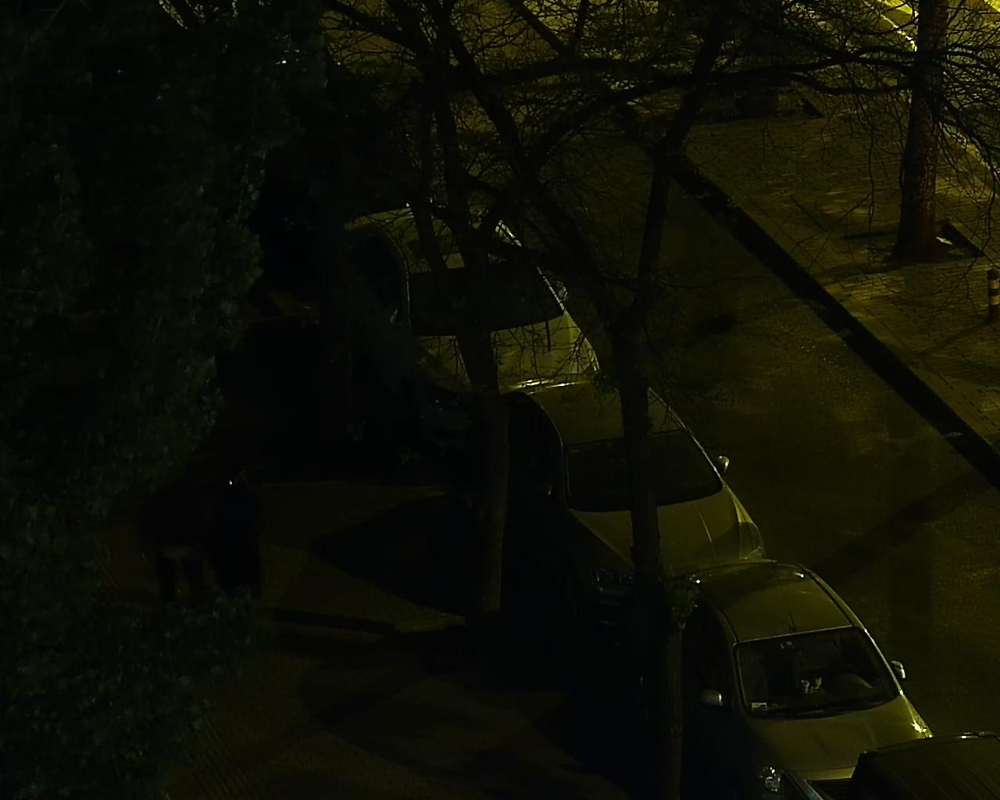


🌡️  Original Thermal/IR Image


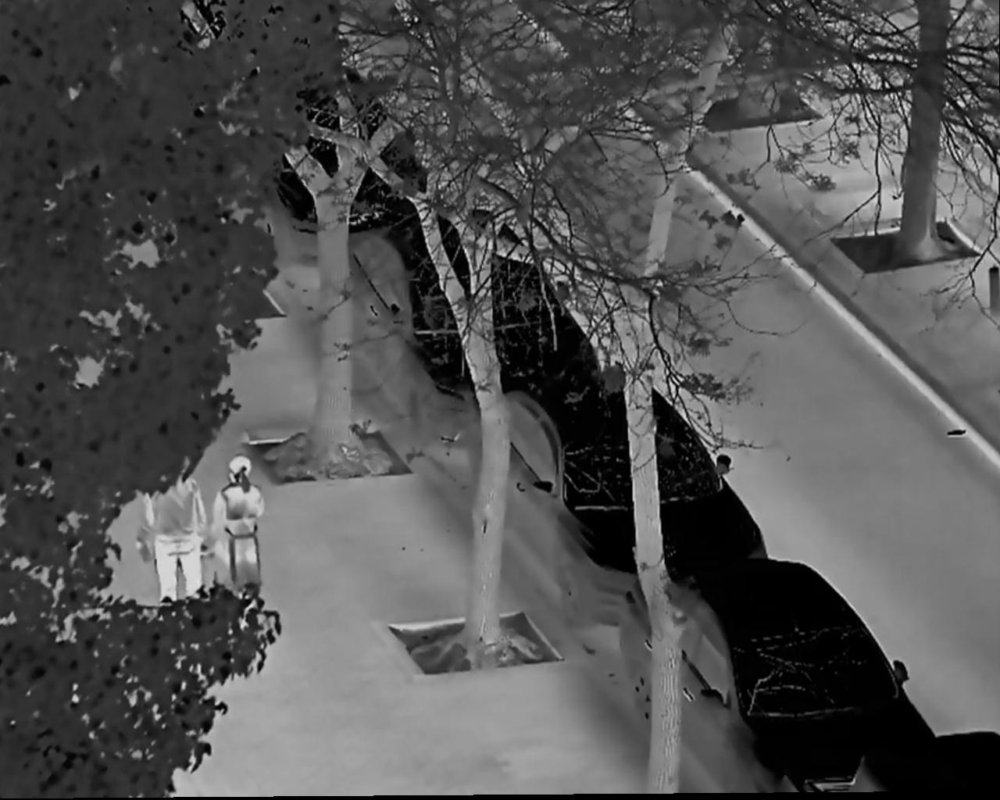


🧪 Simple Fused Image (Alpha Blending)


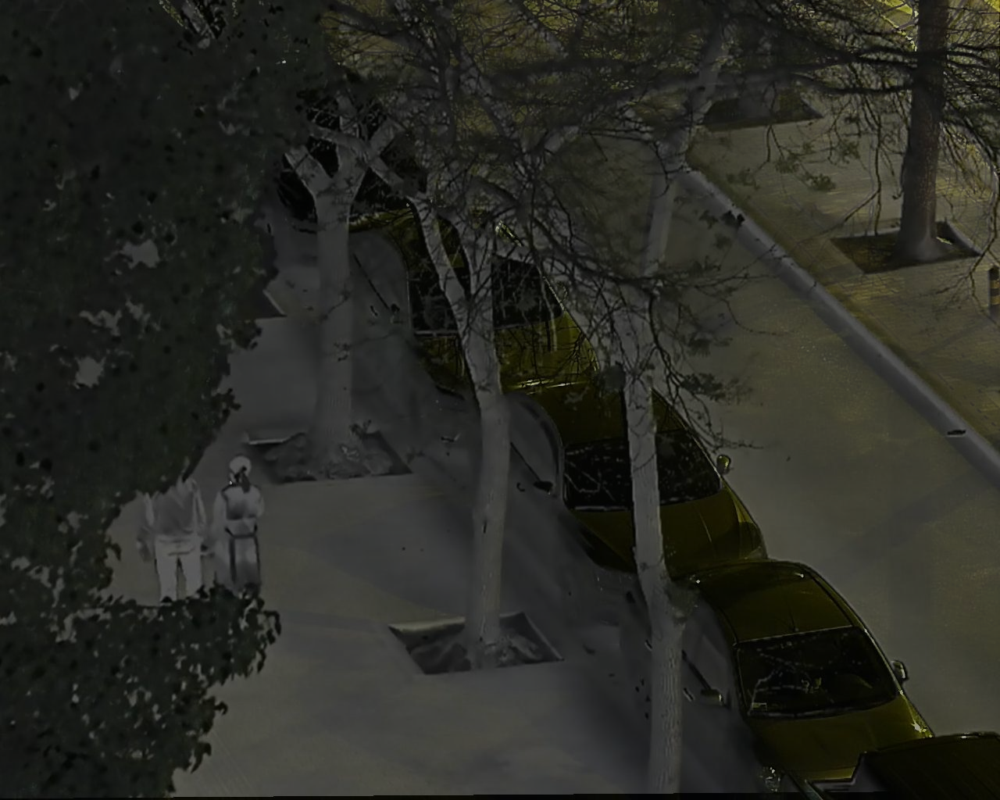


🔥 Attention-Enhanced Fused Image


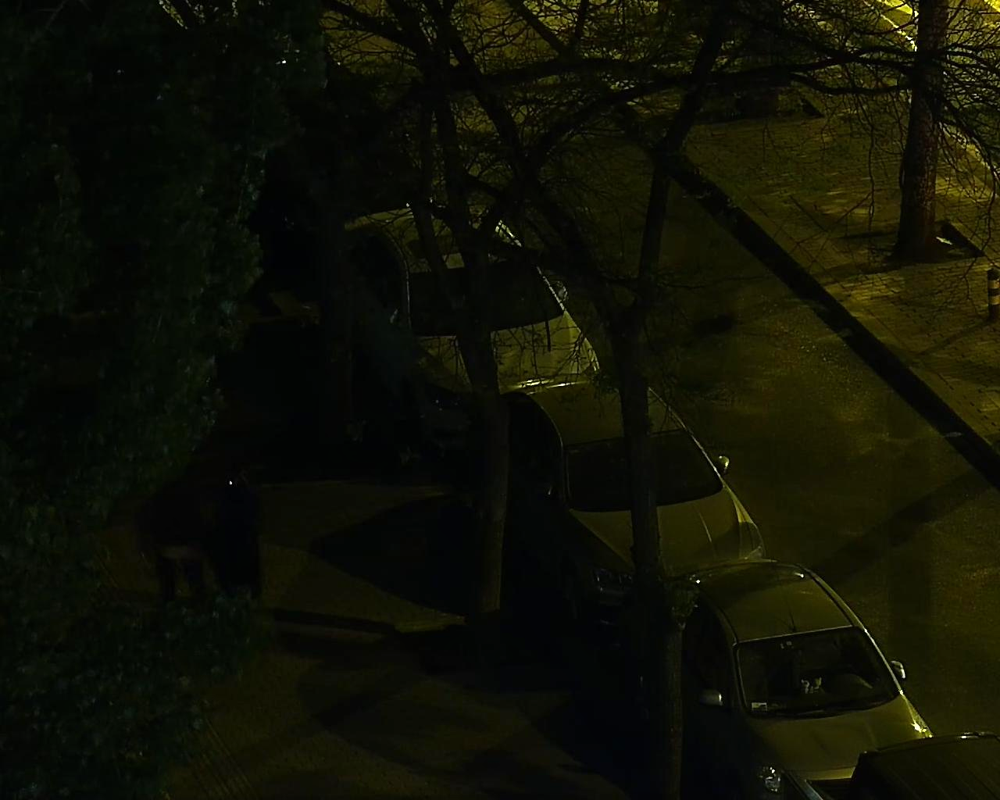


👀 Attention Mask (Thermal-based)


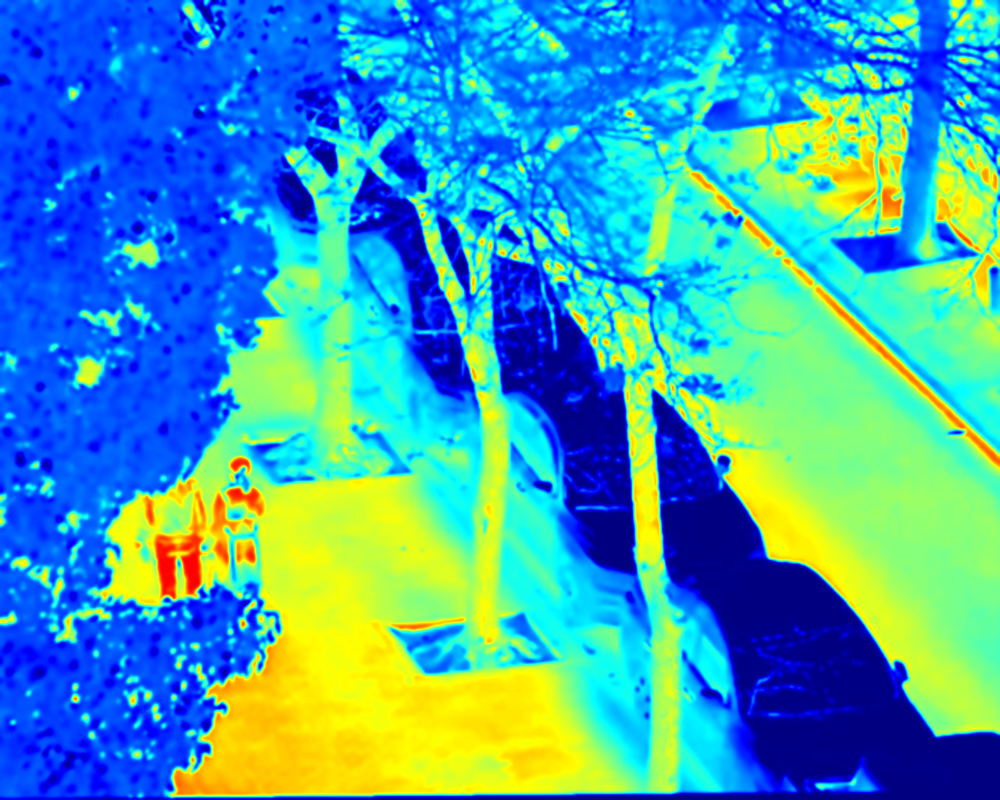


🎯 YOLO DETECTION RESULTS

🎯 Detections on RGB-Only


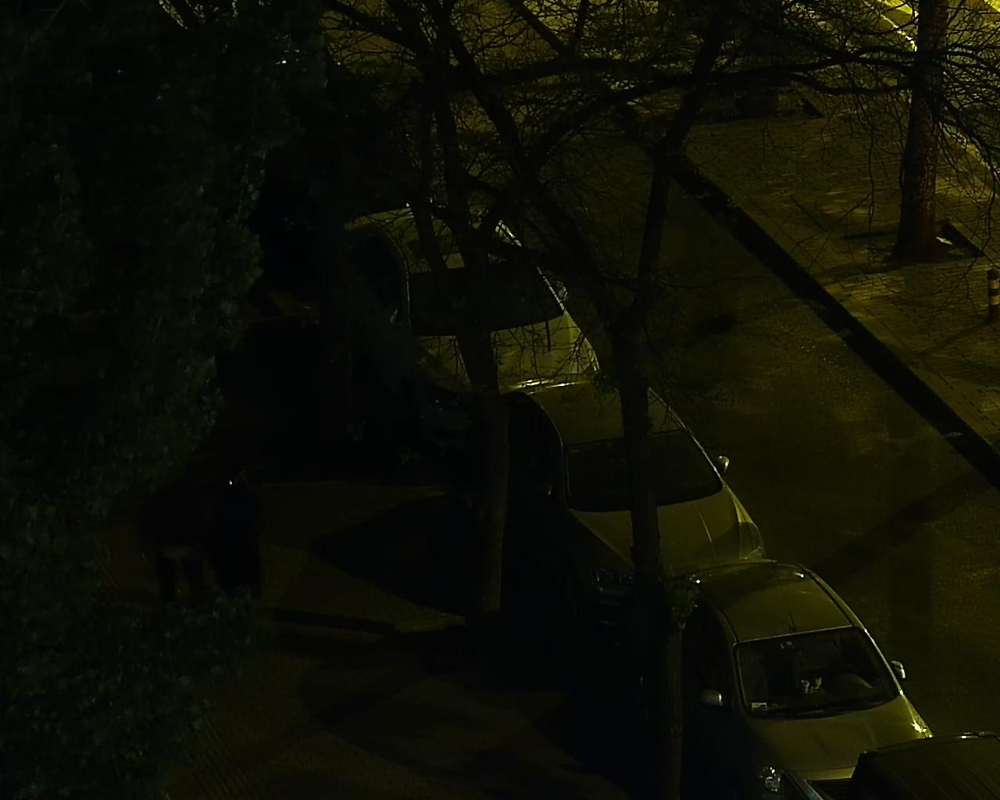

   Detected objects: 0

🎯 Detections on Simple Fused (Alpha)


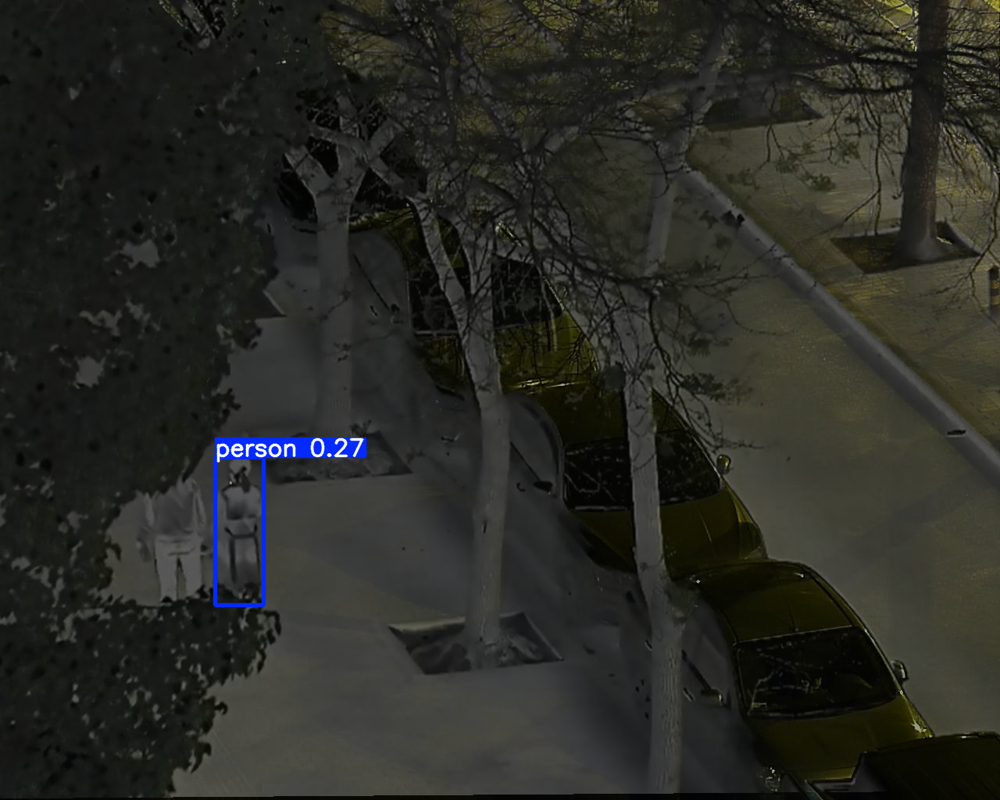

   Detected objects: 1

🎯 Detections on Attention-Enhanced Fused


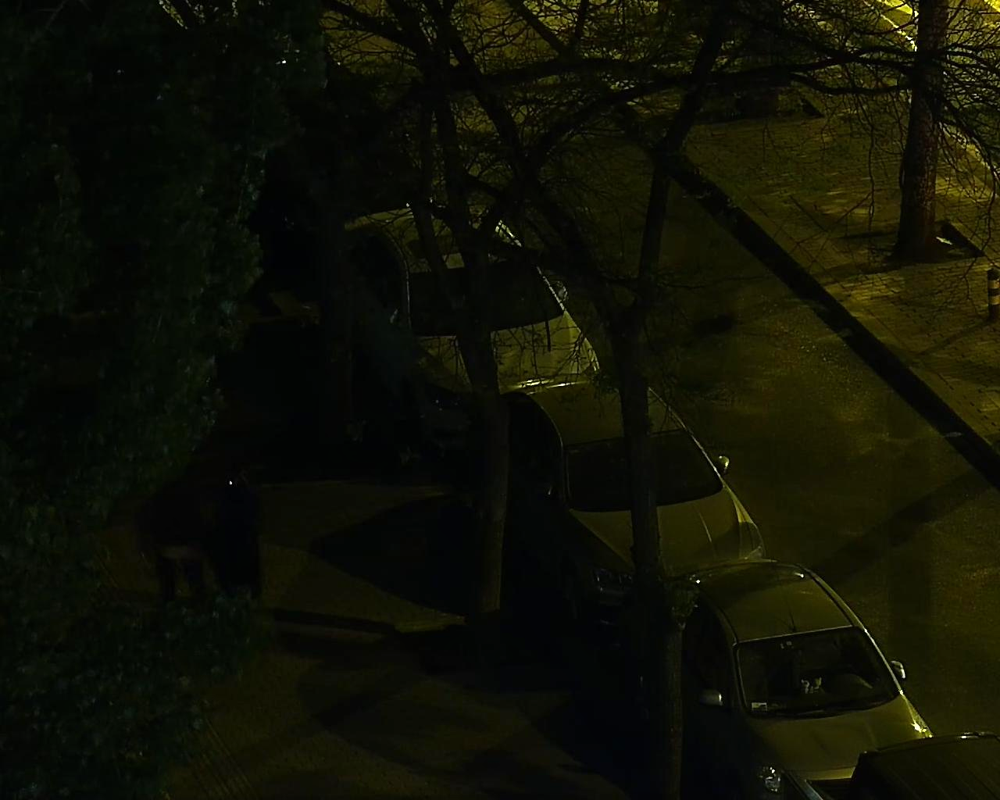

   Detected objects: 0

✅ Demo complete!


In [ ]:
# ============================================
# STEP 1: Apply Fusion Methods
# ============================================

print("🔬 Applying fusion methods...\n")

# Simple alpha-blending fusion
fused_alpha = simple_alpha_fusion(rgb_bgr, ir_gray, alpha=0.6)
print("✅ Simple alpha fusion complete")

# Attention-based fusion
fused_attention, attention_mask = attention_like_fusion(rgb_bgr, ir_gray, boost_factor=0.5)
print("✅ Attention-like fusion complete")

# ============================================
# STEP 2: Run YOLO Inference on All Variants
# ============================================

print("\n🤖 Running YOLO inference on all image variants...\n")

# Inference on RGB-only
results_rgb = model.predict(rgb_bgr, verbose=False)
print("✅ RGB-only detection complete")

# Inference on simple fused image
results_alpha = model.predict(fused_alpha, verbose=False)
print("✅ Simple fused detection complete")

# Inference on attention-enhanced image
results_attention = model.predict(fused_attention, verbose=False)
print("✅ Attention fused detection complete")

# Generate visualizations with bounding boxes
vis_rgb = results_rgb[0].plot()
vis_alpha = results_alpha[0].plot()
vis_attention = results_attention[0].plot()

# ============================================
# STEP 3: Display All Results
# ============================================

print("\n" + "="*60)
print("📊 VISUALIZATION RESULTS")
print("="*60 + "\n")

print("🔍 Original RGB Image")
cv2_imshow(rgb_bgr)

print("\n🌡️  Original Thermal/IR Image")
cv2_imshow(cv2.cvtColor(ir_gray, cv2.COLOR_GRAY2BGR))

print("\n🧪 Simple Fused Image (Alpha Blending)")
cv2_imshow(fused_alpha)

print("\n🔥 Attention-Enhanced Fused Image")
cv2_imshow(fused_attention)

print("\n👀 Attention Mask (Thermal-based)")
cv2_imshow(cv2.applyColorMap(attention_mask, cv2.COLORMAP_JET))

print("\n" + "="*60)
print("🎯 YOLO DETECTION RESULTS")
print("="*60 + "\n")

print("🎯 Detections on RGB-Only")
cv2_imshow(vis_rgb)
print(f"   Detected objects: {len(results_rgb[0].boxes)}")

print("\n🎯 Detections on Simple Fused (Alpha)")
cv2_imshow(vis_alpha)
print(f"   Detected objects: {len(results_alpha[0].boxes)}")

print("\n🎯 Detections on Attention-Enhanced Fused")
cv2_imshow(vis_attention)
print(f"   Detected objects: {len(results_attention[0].boxes)}")

print("\n✅ Demo complete!")

---
## 📊 Model Evaluation Metrics (Reference)

In a full evaluation pipeline on the LLVIP test set, we would compute:

- **mAP (mean Average Precision)**: Primary metric for object detection quality. Measures precision across different IoU thresholds and confidence levels. Higher is better.

- **Precision**: Proportion of correct positive predictions. Important for minimizing false alarms in safety-critical applications.

- **Recall**: Proportion of actual pedestrians successfully detected. Critical for ensuring no pedestrians are missed.

- **F1-Score**: Harmonic mean of precision and recall, providing a balanced measure when both metrics are important.

**For this demo:** We show qualitative detection results on sample images. Full quantitative evaluation would require running inference on the entire test set and computing metrics using ground-truth annotations.

**Expected Outcome:** Multimodal fusion (RGB + Thermal) should improve detection performance compared to RGB-only, especially in night-time scenarios where pedestrians have low visual contrast but strong thermal signatures.

---
## 🎓 Demo Summary

**What We Demonstrated:**
1. ✅ Loaded a custom-trained multimodal YOLO model
2. ✅ Implemented two fusion strategies for RGB + Thermal imagery
3. ✅ Ran inference comparing RGB-only vs. multimodal fusion approaches
4. ✅ Visualized detection results with bounding boxes

**Key Takeaway:**  
Multimodal fusion leverages complementary information from RGB (spatial/texture) and thermal (heat signatures) to achieve more robust pedestrian detection in challenging night-time conditions.

**Thank you for watching this demonstration! 🙏**